# Import packages

In [2]:
import pandas as pd
pd.set_option("display.max_columns", 100)
import os
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, Imputer, OneHotEncoder, PolynomialFeatures, OrdinalEncoder
import numpy as np
import featexp
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost.sklearn import XGBClassifier
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import time

# Import Data

In [3]:
app_train = pd.read_csv("../data/raw/all/application_train.csv")
print(app_train.shape)
app_train.head()

(307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,...,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,...,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,...,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single /

In [5]:
app_test = pd.read_csv("../data/raw/all/application_test.csv")
print(app_test.shape)
app_test.head()

(48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,...,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,...,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.026392,-13976,-1866,-2000.0,-4208,NaN,1,1,0,1,1,0,Sales staff,4.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Business Entity Type 3,0.525734,0.509677,0.612704,0.3052,0.1974,0.9970,0.9592,0.1165,0.32,0.2759,...,0.3081,0.1974,0.9970,0.9597,0.1173,0.32,0.2759,0.375,0.0417,0.2078,0.2446,0.3739,0.0388,0.0817,reg oper account,block of flats,0.3700,Panel,No,0.0,0.0,0.0,0.0,-1805.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010032,-13040,-2191,-4000.0,-4262,16.0

# Preprocessing

## Cleaning

In [6]:
def replace_DAYS_BIRTH_w_AGE(df_in):
    df_in["AGE"] = (df_in['DAYS_BIRTH'] / 365)
    df_in = df_in.drop(['DAYS_BIRTH'], axis=1)
    return df_in

def replace_DAYS_EMPLOYED_w_YEARS_EMPLOYED(df_in):
    df_in["YEARS_EMPLOYED"] = (df_in['DAYS_EMPLOYED'] / -365)
    df_in = df_in.drop(['DAYS_EMPLOYED'], axis=1)
    return df_in

def anom_YEARS_EMPLOYED(df_in):
    df_in['YEARS_EMPLOYED_anom'] = df_in["YEARS_EMPLOYED"] < 0
    df_in['YEARS_EMPLOYED_anom'] = df_in['YEARS_EMPLOYED_anom'].astype(int)
    df_in["YEARS_EMPLOYED"].loc[df_in["YEARS_EMPLOYED"] < 0] = np.NaN
    return df_in

def replace_col_value_w_NA(df_in, col, col_value):
    df_in[col] = df_in[col].replace(col_value, np.nan)
    return df_in


def replace_col_str_w_str(df_in, col, find_str, replace_str):
    df_in[col] = df_in[col].str.replace(find_str, replace_str)
    return df_in


def cleaning(df_in):
    df_in = replace_DAYS_BIRTH_w_AGE(df_in)
    df_in = replace_DAYS_EMPLOYED_w_YEARS_EMPLOYED(df_in)
    df_in = anom_YEARS_EMPLOYED(df_in)
    df_in = replace_col_value_w_NA(df_in, "CODE_GENDER", "XNA")
    df_in = replace_col_value_w_NA(df_in, "NAME_FAMILY_STATUS", "Unknown")
    
    df_in = replace_col_str_w_str(df_in, "NAME_EDUCATION_TYPE", "/", "or")
    df_in = replace_col_str_w_str(df_in, "NAME_HOUSING_TYPE", "/", "or")
    df_in = replace_col_str_w_str(df_in, "NAME_FAMILY_STATUS", "/", "or")
    df_in = replace_col_str_w_str(df_in, "OCCUPATION_TYPE", "/", " or ")
    df_in = replace_col_str_w_str(df_in, "ORGANIZATION_TYPE", ":", " ")
    df_in = replace_col_str_w_str(df_in, "NAME_TYPE_SUITE", ",", "")
    df_in = replace_col_str_w_str(df_in, "WALLSMATERIAL_MODE", ",", "")
    return df_in 

In [7]:
# pd.options.mode.chained_assignment = None 
# app_train_cleaned = cleaning(app_train)
# app_test_cleaned = cleaning(app_test)
# pd.options.mode.chained_assignment = "warn"

## Domain Expertise

In [8]:
def domain_features(df_in):
    df_in['CREDIT_INCOME_PERCENT'] = df_in['AMT_CREDIT'] / df_in['AMT_INCOME_TOTAL']
    df_in['ANNUITY_INCOME_PERCENT'] = df_in['AMT_ANNUITY'] / df_in['AMT_INCOME_TOTAL']
    df_in['CREDIT_TERM'] = df_in['AMT_ANNUITY'] / df_in['AMT_CREDIT']
    df_in['YEARS_EMPLOYED_PERCENT'] = df_in['YEARS_EMPLOYED'] / df_in['AGE']
    return df_in

#     testing data
#     app_test_domain['CREDIT_INCOME_PERCENT'] = app_test_domain['AMT_CREDIT'] / app_test_domain['AMT_INCOME_TOTAL']
#     app_test_domain['ANNUITY_INCOME_PERCENT'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_INCOME_TOTAL']
#     app_test_domain['CREDIT_TERM'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_CREDIT']
#     app_test_domain['YEARS_EMPLOYED_PERCENT'] = app_test_domain['YEARS_EMPLOYED'] / app_test_domain['AGE']

# app_train_domain = domain_features(app_train_cleaned)
# app_test_domain = domain_features(app_test_cleaned)
# app_test_domain = app_test.copy()

## feature engineering

### Polyfeatures

## Preprocessing

In [9]:
# class MultiColumnLabelEncoder:
#     def __init__(self, columns = None):
#         self.columns = columns # array of column names to encode

#     def fit(self,X,y=None):
#         return self # not relevant here

#     def transform(self,X):
#         '''
#         Transforms columns of X specified in self.columns using
#         LabelEncoder(). If no columns specified, transforms all
#         columns in X.
#         '''
#         output = X.copy()
#         if self.columns is not None:
#             for col in self.columns:
#                 output[col] = LabelEncoder().fit_transform(output[col])
#         else:
#             for colname,col in output.iteritems():
#                 output[colname] = LabelEncoder().fit_transform(col)
#         return output

#     def fit_transform(self,X,y=None):
#         return self.fit(X,y).transform(X)

In [121]:
df_train = app_train.copy()

# df_train = df_train.sample(10000, random_state=42)

# cleaning
pd.options.mode.chained_assignment = None 
df_train = cleaning(df_train)
pd.options.mode.chained_assignment = "warn"

# domain expertise features
df_train = domain_features(df_train)

# drop nulls
# df_train.dropna(inplace=True)

# drop the ID column
df_train = df_train.drop("SK_ID_CURR", axis=1)

# define x and y
y = df_train["TARGET"]
X = df_train.drop("TARGET", axis=1)

# Create a preprocessor for numerical and categorical columns
num_features = X.dtypes[(X.dtypes != object) & (X.dtypes != bool)].index.tolist()
cat_features = X.dtypes[(X.dtypes == object) | (X.dtypes == bool)].index.tolist()

si_X_gs = SimpleImputer(strategy='most_frequent')
X[cat_features] = si_X_gs.fit_transform(X[cat_features])
X = pd.get_dummies(X)

# # Identify cols with nulls for imputation
# cols_w_nulls = X.isnull().sum()[X.isnull().sum() > 0].index.tolist()
# cat_cols_w_nulls = [col for col in cat_features if col in cols_w_nulls]
# num_cols_w_nulls = [col for col in num_features if col in cols_w_nulls]

ohe_cols = list(set(X.columns) - set(num_features))

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', MinMaxScaler())])

# preprocessor 
preprocessor = ColumnTransformer(
    transformers=[
        ("numericals", numeric_transformer, num_features),
        ("ohe_passthrough", "passthrough", ohe_cols),
    ])

In [122]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=.3, random_state=42)

In [123]:
# Logistic Regression
lr_model = Pipeline([("preprocessor", preprocessor), 
                     ("model", LogisticRegression(class_weight="balanced", solver="liblinear", random_state=42))])

# Random Forest
rf_model = Pipeline([("preprocessor", preprocessor), 
                     ("model", RandomForestClassifier(class_weight="balanced", n_estimators=100, n_jobs=-1))])

# XGBoost
xgb_model = Pipeline([("preprocessor", preprocessor), 
                      # Add a scale_pos_weight to make it balanced
                      ("model", XGBClassifier(scale_pos_weight=(1 - y.mean()), n_jobs=-1))])

In [124]:
# X_sample = X.sample(100000)

# X_sample = X_sample.append(pd.Series([np.nan for c in X_sample.columns], index=X_sample.columns), ignore_index=True)

# times = []
# for col in cat_features:
#     si = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
#     start = time.time()
#     si.fit_transform(X_sample[col].values.reshape(-1, 1))
#     end = time.time()
#     times.append((end-start))
# df_times = pd.concat([pd.Series(cat_features), pd.Series(times)], axis=1)
# df_times[1] = df_times[1]/60
# df_times.sort_values(1, ascending=False)

# Modelling

## Logistic Regression

In [126]:
start = time.time()

gs = GridSearchCV(lr_model, {"model__C": [1, 1.3, 1.5]}, n_jobs=-1, cv=5, scoring="accuracy", iid=False)
gs.fit(X_train, y_train)

print(gs.best_params_)
print(gs.best_score_)

lr_model.set_params(**gs.best_params_)
lr_model.get_params("model")

lr_model.fit(X_train, y_train)
y_pred = lr_model.predict(X_test)

accuracy_score(y_test, y_pred)

print(classification_report(y_test, y_pred))

end = time.time()
elapsed = end - start
print(elapsed)

{'model__C': 1}
0.7007161637764684
              precision    recall  f1-score   support

           0       0.95      0.71      0.81      2753
           1       0.16      0.63      0.26       247

   micro avg       0.70      0.70      0.70      3000
   macro avg       0.56      0.67      0.53      3000
weighted avg       0.89      0.70      0.77      3000

9.723422765731812


In [127]:
# # # Extract feature names from one-hot encoded
# preprocessor = lr_model.named_steps["preprocessor"]
# new_ohe_features = [f"{col}__{val}" for col, vals in zip(cat_features, ohe_categories) for val in vals]
# all_features = num_features + new_ohe_features
# pd.DataFrame(lr_model.named_steps["preprocessor"].transform(X_train), columns=all_features).head()

all_features = X_train.columns.tolist()

In [88]:
import eli5

In [131]:
eli5.show_weights(lr_model.named_steps["model"], feature_names=all_features)

In [132]:
i = 200
eli5.show_prediction(lr_model.named_steps["model"], 
                     lr_model.named_steps["preprocessor"].transform(X_test)[i],
                     feature_names=all_features, show_feature_values=True)

## Random Forest

In [133]:
gs = GridSearchCV(rf_model, {"model__max_depth": [10, 15], 
                             "model__min_samples_split": [5, 10],
                            }, 
                  n_jobs=-1, cv=5, scoring="accuracy")
gs.fit(X_train, y_train)

print(gs.best_params_)
print(gs.best_score_)

rf_model.set_params(**gs.best_params_)
rf_model.get_params("model")

rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

print(accuracy_score(y_test, y_pred))

print(classification_report(y_test, y_pred))

{'model__max_depth': 15, 'model__min_samples_split': 5}
0.9038571428571428
0.9013333333333333
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2753
           1       0.30      0.15      0.20       247

   micro avg       0.90      0.90      0.90      3000
   macro avg       0.61      0.56      0.57      3000
weighted avg       0.88      0.90      0.89      3000



In [134]:
eli5.show_weights(rf_model.named_steps["model"], 
                  feature_names=all_features)

Weight,Feature
0.0669 ± 0.0593,EXT_SOURCE_3
0.0557 ± 0.0560,EXT_SOURCE_2
0.0305 ± 0.0323,AGE
0.0289 ± 0.0313,EXT_SOURCE_1
0.0288 ± 0.0332,YEARS_EMPLOYED
0.0268 ± 0.0274,DAYS_LAST_PHONE_CHANGE
0.0265 ± 0.0290,YEARS_EMPLOYED_PERCENT
0.0263 ± 0.0230,DAYS_REGISTRATION
0.0261 ± 0.0248,CREDIT_TERM
0.0251 ± 0.0228,AMT_ANNUITY


## XGBoost

In [135]:
gs = GridSearchCV(xgb_model, {"model__max_depth": [5, 10],
                              "model__min_child_weight": [5, 10],
                              "model__n_estimators": [100]},
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

print(gs.best_params_)
print(gs.best_score_)

xgb_model.set_params(**gs.best_params_)
xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)

print(accuracy_score(y_test, y_pred))

print(classification_report(y_test, y_pred))

{'model__max_depth': 5, 'model__min_child_weight': 10, 'model__n_estimators': 100}
0.9154285714285715
0.9193333333333333
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      2753
           1       0.69      0.04      0.07       247

   micro avg       0.92      0.92      0.92      3000
   macro avg       0.81      0.52      0.51      3000
weighted avg       0.90      0.92      0.88      3000



In [136]:
eli5.show_weights(xgb_model.named_steps["model"], 
                  feature_names=all_features)

Weight,Feature
0.0203,LIVINGAPARTMENTS_MODE
0.0184,EXT_SOURCE_3
0.0171,ORGANIZATION_TYPE_Postal
0.0170,APARTMENTS_AVG
0.0167,WEEKDAY_APPR_PROCESS_START_MONDAY
0.0160,EXT_SOURCE_2
0.0153,ORGANIZATION_TYPE_Religion
0.0148,EXT_SOURCE_1
0.0144,WALLSMATERIAL_MODE_Others
0.0143,LIVINGAREA_MEDI


# Model Interpretability

## LIME

LIME stands for Local Interpretable Model-Agnostic Explanations. We can use it with any model we've built in order to explain why it took a specific decision for a given observation. To do so, LIME creates a dataset in the locality of our observation by perturbating the different features. Then it fits a local linear model on this data and uses the weights on each feature to provide an explanation.

In order to explain why the model classifies invidividual observations as class 0 or 1, we are going to use the LimeTabularExplainer from the library lime, this is the main explainer to use for tabular data. Lime also provides an explainer for text data, for images and for time-series.

When using the tabular explainer, we need to provide our training set as parameter so that lime can compute statistics on each feature, either mean and std for numerical features, or frequency of values for categorical features. Those statistics are used to scale the data and generate new perturbated data to train our local linear models on.

In [144]:
from lime.lime_tabular import LimeTabularExplainer

The parameters passed to the explainer are:

- our training set, we need to make sure we use the training set without one hot encoding
mode: the explainer can be used for classification or regression
- feature_names: list of labels for our features
- categorical_features: list of indexes of categorical features
- categorical_names: dict mapping each index of categorical feature to a list of corresponding labels
- dicretize_continuous: will discretize numerical values into buckets that can be used for explanation. For instance it can tell us that the decision was made because distance is in bucket [5km, 10km] instead of telling us distance is an importante feature.

First, in order to get the categorical_names parameter we need to build a dictionary with indexes of categorical values in original dataset as keys and lists of possible categories as values:

In [146]:
# categorical_names = {}
# for col in cat_features:
#     categorical_names[X_train.columns.get_loc(col)] = [new_col.split("__")[1] 
#                                                        for new_col in new_ohe_features 
#                                                        if new_col.split("__")[0] == col]
categorical_names = {}
for col in ohe_cols:
    categorical_names[X_train.columns.get_loc(col)] = X_train[col].unique().tolist()
categorical_names

{193: [0, 1],
 218: [0],
 238: [0, 1],
 161: [0, 1],
 231: [0, 1],
 153: [0, 1],
 235: [0, 1],
 214: [0, 1],
 170: [0, 1],
 206: [0, 1],
 188: [0, 1],
 113: [1, 0],
 126: [0, 1],
 223: [0, 1],
 129: [1, 0],
 110: [1, 0],
 181: [0, 1],
 190: [0, 1],
 208: [0, 1],
 204: [0, 1],
 217: [0, 1],
 241: [0, 1],
 115: [0, 1],
 229: [0, 1],
 156: [0, 1],
 118: [1, 0],
 189: [0, 1],
 221: [0, 1],
 191: [0, 1],
 185: [0, 1],
 173: [0, 1],
 142: [0, 1],
 143: [0, 1],
 194: [0, 1],
 121: [0, 1],
 179: [0, 1],
 152: [0, 1],
 150: [0, 1],
 135: [0, 1],
 148: [1, 0],
 226: [0, 1],
 234: [0, 1],
 209: [0, 1],
 122: [0, 1],
 182: [0, 1],
 128: [0, 1],
 124: [0, 1],
 112: [0, 1],
 159: [0, 1],
 212: [0, 1],
 202: [0, 1],
 139: [0, 1],
 183: [0, 1],
 157: [0, 1],
 149: [0, 1],
 210: [0, 1],
 240: [1, 0],
 225: [0, 1],
 131: [0, 1],
 200: [0, 1],
 132: [0, 1],
 111: [1, 0],
 138: [1, 0],
 169: [0, 1],
 198: [1, 0],
 233: [0, 1],
 155: [0, 1],
 134: [1, 0],
 216: [0, 1],
 186: [0, 1],
 230: [1, 0],
 147: [0,

Lime needs the dataset that is passed to have categorical values converted to integer labels that maps to the values in categorical_names. For instance, label 0 for the column 2 will map to divorced. We will use a custom helper function to do so, that converts data from original to LIME and from LIME to original format.

In [147]:
def convert_to_lime_format(X, categorical_names, col_names=None, invert=False):
    """Converts data with categorical values as string into the right format 
    for LIME, with categorical values as integers labels.

    It takes categorical_names, the same dictionary that has to be passed
    to LIME to ensure consistency. 

    col_names and invert allow to rebuild the original dataFrame from
    a numpy array in LIME format to be passed to a Pipeline or sklearn
    OneHotEncoder
    """

    # If the data isn't a dataframe, we need to be able to build it
    if not isinstance(X, pd.DataFrame):
        X_lime = pd.DataFrame(X, columns=col_names)
    else:
        X_lime = X.copy()

    for k, v in categorical_names.items():
        if not invert:
            label_map = {
                str_label: int_label for int_label, str_label in enumerate(v)
            }
        else:
            label_map = {
                int_label: str_label for int_label, str_label in enumerate(v)
            }

        X_lime.iloc[:, k] = X_lime.iloc[:, k].map(label_map)

    return X_lime

In [148]:
convert_to_lime_format(X_train, categorical_names).head()

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,...,ORGANIZATION_TYPE_Industry type 6,ORGANIZATION_TYPE_Industry type 7,ORGANIZATION_TYPE_Industry type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade type 1,ORGANIZATION_TYPE_Trade type 2,ORGANIZATION_TYPE_Trade type 3,ORGANIZATION_TYPE_Trade type 4,ORGANIZATION_TYPE_Trade type 5,ORGANIZATION_TYPE_Trade type 6,ORGANIZATION_TYPE_Trade type 7,ORGANIZATION_TYPE_Transport type 1,ORGANIZATION_TYPE_Transport type 2,ORGANIZATION_TYPE_Transport type 3,ORGANIZATION_TYPE_Transport type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA,FONDKAPREMONT_MODE_not specified,FONDKAPREMONT_MODE_org spec account,FONDKAPREMONT_MODE_reg oper account,FONDKAPREMONT_MODE_reg oper spec account,HOUSETYPE_MODE_block of flats,HOUSETYPE_MODE_specific housing,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,WALLSMATERIAL_MODE_Stone brick,WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
13215,2,90000.0,225000.0,11250.0,225000.0,0.031329,-4179.0,-2397,NaN,1,1,0,1,0,0,3.0,2,2,7,0,0,0,0,0,0,0.197670,0.278176,0.387625,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
97986,0,135000.0,270000.0,13500.0,270000.0,0.010006,-3158.0,-527,NaN,1,1,0,1,0,0,1.0,2,2,14,0,0,0,1,1,0,NaN,0.594290,NaN,0.1113,0.0971,0.9945,0.9252,0.0307,0.12,0.1034,0.3333,0.3750,0.0994,0.0908,0.1370,0.0,0.0000,0.1134,0.1008,0.9945,0.9281,0.0310,0.1208,0.1034,0.3333,...,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
260291,0,81000.0,343377.0,16830.0,283500.0,0.031329,-7178.0,-1981,NaN,1,1,0,1,0,0,2.0,2,2,12,0,0,0,0,0,0,NaN,0.265256,0.350696,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
85906,0,157500.0,135000.0,12816.0,135000.0,0.026392,-9754.0,-4101,NaN,1,0,0,1,1,0,1.0,2,2,13,0,0,0,0,0,0,NaN,0.566751,0.740799,0.6351,0.5325,0.9841,NaN,NaN,0.00,1.0000,0.1667,NaN,0.0542,NaN,0.5703,NaN,0.0093,0.6471,0.5526,0.9841,NaN,NaN,0.0000,1.0000,0.1667,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
211707,0,157500.0,795465.0,31675.5,711000.0,0.025164,-1656.0,-5059,NaN,1,0,0,1,0,0,2.0,2,2,15,1,0,0,1,0,0,0.772879,0.749039,0.661024,0.1237,0.0730,0.9891,0.8504,0.0527,0.12,0.1034,0.3750,0.4167,0.1972,0.1009,0.1383,0.0,0.0024,0.1261,0.0758,0.9891,0.85

In [ ]:
explainer = LimeTabularExplainer(convert_to_lime_format(X_train, categorical_names).values,
                                 mode="classification",
                                 feature_names=X_train.columns.tolist(),
                                 categorical_names=categorical_names,
                                 categorical_features=categorical_names.keys(),
                                 discretize_continuous=True,
                                 random_state=42)

Explain new observations

We'll create a variable called observation that contains our ith observation in the test dataset.

In [150]:
i = 2
X_observation = X_test.iloc[[i], :]
X_observation

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,...,ORGANIZATION_TYPE_Industry type 6,ORGANIZATION_TYPE_Industry type 7,ORGANIZATION_TYPE_Industry type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade type 1,ORGANIZATION_TYPE_Trade type 2,ORGANIZATION_TYPE_Trade type 3,ORGANIZATION_TYPE_Trade type 4,ORGANIZATION_TYPE_Trade type 5,ORGANIZATION_TYPE_Trade type 6,ORGANIZATION_TYPE_Trade type 7,ORGANIZATION_TYPE_Transport type 1,ORGANIZATION_TYPE_Transport type 2,ORGANIZATION_TYPE_Transport type 3,ORGANIZATION_TYPE_Transport type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA,FONDKAPREMONT_MODE_not specified,FONDKAPREMONT_MODE_org spec account,FONDKAPREMONT_MODE_reg oper account,FONDKAPREMONT_MODE_reg oper spec account,HOUSETYPE_MODE_block of flats,HOUSETYPE_MODE_specific housing,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,WALLSMATERIAL_MODE_Stone brick,WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
96773,2,216000.0,474048.0,24331.5,360000.0,0.009657,-7433.0,-1588,12.0,1,1,0,1,0,0,4.0,2,2,12,0,0,0,0,0,0,NaN,0.298382,0.377404,0.1041,0.073,0.9826,0.762,0.0103,0.0,0.2069,0.1667,0.2083,0.0936,0.0849,0.0604,0.0,0.0,0.1061,0.0758,0.9826,0.7713,0.0104,0.0,0.2069,0.1667,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,0


In [151]:
print(f"""\
* True label: {y_test.iloc[i]}
* LR: \t{lr_model.predict_proba(X_observation)[0]}
* RF: \t{rf_model.predict_proba(X_observation)[0]}
* XGB: \t{xgb_model.predict_proba(X_observation)[0]}""")

* True label: 0
* LR: 	[0.34160891 0.65839109]
* RF: 	[0.63041787 0.36958213]
* XGB: 	[0.9040804 0.0959196]


Let's convert our observation to lime format and convert it to a numpy array.

In [152]:
observation = convert_to_lime_format(X_test.iloc[[i], :],categorical_names).values[0]
observation

array([ 2.00000000e+00,  2.16000000e+05,  4.74048000e+05,  2.43315000e+04,
        3.60000000e+05,  9.65700000e-03, -7.43300000e+03, -1.58800000e+03,
        1.20000000e+01,  1.00000000e+00,  1.00000000e+00,  0.00000000e+00,
        1.00000000e+00,  0.00000000e+00,  0.00000000e+00,  4.00000000e+00,
        2.00000000e+00,  2.00000000e+00,  1.20000000e+01,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,             nan,  2.98381919e-01,  3.77404249e-01,
        1.04100000e-01,  7.30000000e-02,  9.82600000e-01,  7.62000000e-01,
        1.03000000e-02,  0.00000000e+00,  2.06900000e-01,  1.66700000e-01,
        2.08300000e-01,  9.36000000e-02,  8.49000000e-02,  6.04000000e-02,
        0.00000000e+00,  0.00000000e+00,  1.06100000e-01,  7.58000000e-02,
        9.82600000e-01,  7.71300000e-01,  1.04000000e-02,  0.00000000e+00,
        2.06900000e-01,  1.66700000e-01,  2.08300000e-01,  9.58000000e-02,
        9.27000000e-02,  

In order to explain a prediction, we use the explain_instance method on our explainer. This will generate new data with perturbated features around the observation and learn a local linear model. It needs to take:

- our observation as a numpy array
- a function that uses our model to predict probabilities given the data (in same format we've passed in our explainer). That means we cannot pass directly our rf_model.predict_proba because our pipeline expects string labels for categorical values. We will need to create a custom function rf_predict_proba that first converts back integer labels to strings and then calls rf_model.predict_proba.
- num_features: number of features to consider in explanation

In [153]:
# Let write a custom predict_proba functions for our models:
from functools import partial

def custom_predict_proba(X, model):
    X_str = convert_to_lime_format(X, categorical_names, col_names=X_train.columns, invert=True)
    return model.predict_proba(X_str)

lr_predict_proba = partial(custom_predict_proba, model=lr_model)
rf_predict_proba = partial(custom_predict_proba, model=rf_model)
xgb_predict_proba = partial(custom_predict_proba, model=xgb_model)

In [154]:
explanation = explainer.explain_instance(observation, lr_predict_proba, num_features=5)

Now that we have generated our explanation, we have access to several representations. The most useful one when working in a notebook is show_in_notebook.

On the left it shows the list of probabilities for each class, here the model classified our observation as 0 (non subsribed) with a high probability.

In [155]:
explanation.show_in_notebook(show_table=True, show_all=False)

If you set show_table=True, you will see the table with the most important features for this observation on the right.

In [156]:
explanation.show_in_notebook(show_table=True, show_all=True)

You can also save the explanation to an html file with save_to_file to share it.

In [158]:
explanation.save_to_file("explanation.html")


LIME is fitting a linear model on a local perturbated dataset. You can access the coefficients, the intercept and the R squared of the linear model by calling respectively .local_exp, .intercept and .score on your explanation.

In [157]:
print(explanation.local_exp)
print(explanation.intercept)
print(explanation.score)

{1: [(24, 0.10415291274656377), (23, -0.08591507520007857), (134, 0.08583560766391397), (77, -0.08272670023990701), (111, 0.07148995033970218)]}
{1: 0.2769122650917602}
0.244298447728028


If your R-squared is low, the linear model that LIME fitted isn't a great approximation to your model, which means you should not rely too much on the explanation it provides.

Random Forest:

In [159]:
explanation = explainer.explain_instance(observation, rf_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.32380775116616933


XGBoost

In [160]:
explanation = explainer.explain_instance(observation, xgb_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.41281344615307347


## SHAP

In [161]:
import shap
# Need to load JS vis in the notebook
shap.initjs()

SHAP has a generic explainer that works for any model and a TreeExplainer optimised for tree based models. Here we will focus on the TreeExplainer with our XGB model (the hardest to intepret)

In [162]:
shap_explainer = shap.TreeExplainer(xgb_model.named_steps["model"])

In order to compute the shapley values with the tree explainer, we need to call the shap_values methods passing a dataset. That can be quite computationally expensive, so we will only pass 1000 samples picked at random.

In [163]:
observations = xgb_model.named_steps["preprocessor"].transform(X_train.sample(1000, random_state=42))
shap_values = shap_explainer.shap_values(observations)

Now we can start visualising our explanations using the force_plot function from the shap package passing our first shap_value (we also need to pass explainer.expected_value which is the base value).

In [164]:
i = 0
shap.force_plot(shap_explainer.expected_value, shap_values[i], 
                features=observations[i], feature_names=all_features)

This explanation shows how each feature contributes to shifting the prediction from the base value to the output value of the model either by decreasing or increasing the probability of our class.

We can also visualise all points in our dataset at once with a given class by passing all explanations for that class to force_plot

In [165]:
shap.force_plot(shap_explainer.expected_value, shap_values,
                features=observations, feature_names=all_features)

We can see our 1000 samples on the x axis. The y-axis corresponds to the same scale we were looking at before, where blue values corresponds to the probability decreasing, red increasing. Hover with your mouse on a point to see the main features impacting a given observation. You can also use the drop down on the left to visualise the impact of specific features, for example duration only.

Another interesting plot that we can generate with SHAP is the summary_plot, it can be seen as a feature importance plot with more meaningful insights. Below we're plotting the summary plot for class 1 on the whole subset. The colour corresponds to the value of the feature and the x axis corresponds to the SHAP value, meaning the impact on the probability.

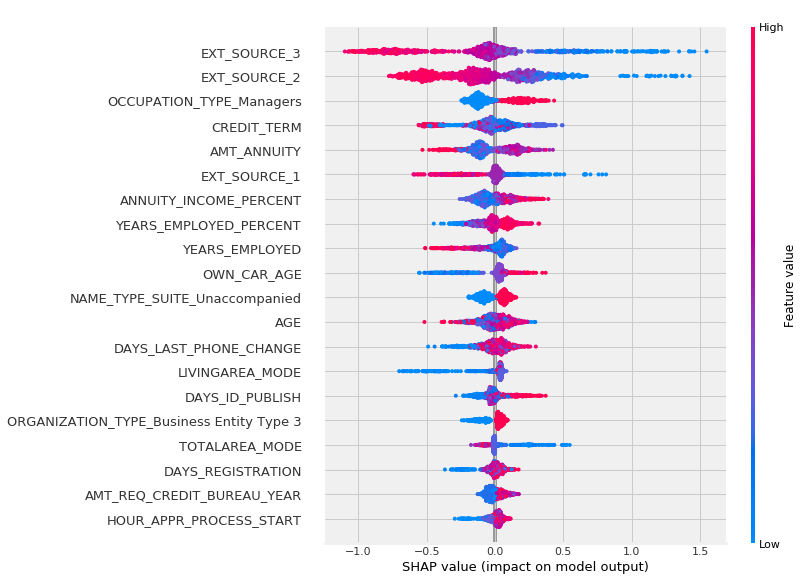

In [166]:
shap.summary_plot(shap_values, features=observations, feature_names=all_features)

That's better than the built-in feature importance on RandomForest because not only we can see what features are important but also how they affect our predictions.

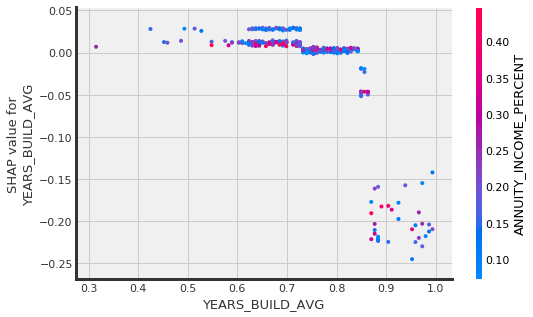

In [167]:
shap.dependence_plot("YEARS_BUILD_AVG", shap_values, 
                     pd.DataFrame(observations, columns=all_features))